<a href="https://colab.research.google.com/github/villa-lobos17/ImageFilters/blob/main/Laboratorio_2_Percepcion_Computacional.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Filtros Espaciales

Existen dos tipos de filtros: lineales y no lineales. Ejemplos de filtros lineales son la media y los filtros Laplacian. Los filtros no lineales constituyen filtros como filtros medianos, mínimos, máximos y Sobel.

Cada uno de esos filtros tiene un propósito específico, y está diseñado para eliminar el ruido o mejorar algunos aspectos de la imagen.

¿Cómo se realiza el filtrado de imágenes?
Para llevar a cabo un proceso de filtrado de imágenes, necesitamos un filtro,también llamado máscara. Este filtro suele ser una ventana cuadrada bidimensional, es decir, una ventana con las mismas dimensiones (ancho y alto).

El filtro incluirá números. Esos números se llaman coeficientes,y son lo que realmente determina el efecto del filtro y cómo se verá la imagen de salida. La figura siguiente muestra un ejemplo de un filtro, que tiene nueve valores (coeficientes).

![image.png](attachment:image.png)

Para aplicar el filtro, la ventana se desliza sobre la imagen. Este proceso de deslizar una ventana de filtro sobre una imagen se denomina convolución en el dominio espacial. La ventana se colocará en cada píxel, donde el centro del filtro debe superponerse a ese píxel.

Una vez que se produce esta superposición, los píxeles de la subimagen que el filtro está encima se multiplicarán con los coeficientes correspondientes del filtro. En este caso, tendremos una nueva matriz con nuevos valores similares al tamaño del filtro (es decir). Por último, el valor del píxel central se reemplazará por un nuevo valor utilizando una ecuación matemática específica dependiendo del tipo de filtro utilizado.

El proceso se repite para cada píxel de la imagen, incluidos los píxeles en el límite de la imagen. Pero, como puede ver, parte del filtro residirá fuera de la imagen al colocar el filtro en los píxeles de límite. En este caso, realizamos relleno.

Este proceso simplemente significa que insertamos nuevos valores de píxel en la subimagen debajo de la parte del filtro que sale de la imagen antes del proceso de convolución, ya que esa parte aparentemente no contiene ningún valor de píxel. Esos píxeles acolchados podrían ser ceros o un valor constante.

Tomado de: https://code.tutsplus.com/tutorials/image-filtering-in-python--cms-29202

In [119]:
from typing import Tuple
import cv2
import numpy as np
from matplotlib import pyplot as plt

## Filtro mediana

En el filtro de mediana, elegimos una ventana deslizante que se moverá a través de todos los píxeles de la imagen. Lo que hacemos aquí es que recopilamos los valores de píxel que vienen bajo el filtro y tomamos la mediana de esos valores. El resultado se asignará al píxel central.

Este tipo de filtro se utiliza para eliminar el ruido, y funciona mejor con imágenes que sufren de ruido de sal y pimienta.

Se aplica el filtro de la media con una venta de tamaño 9x9.

In [120]:
img = cv2.imread('Images/cameramannoise.jpg')
dst = cv2.medianBlur(img, 9)

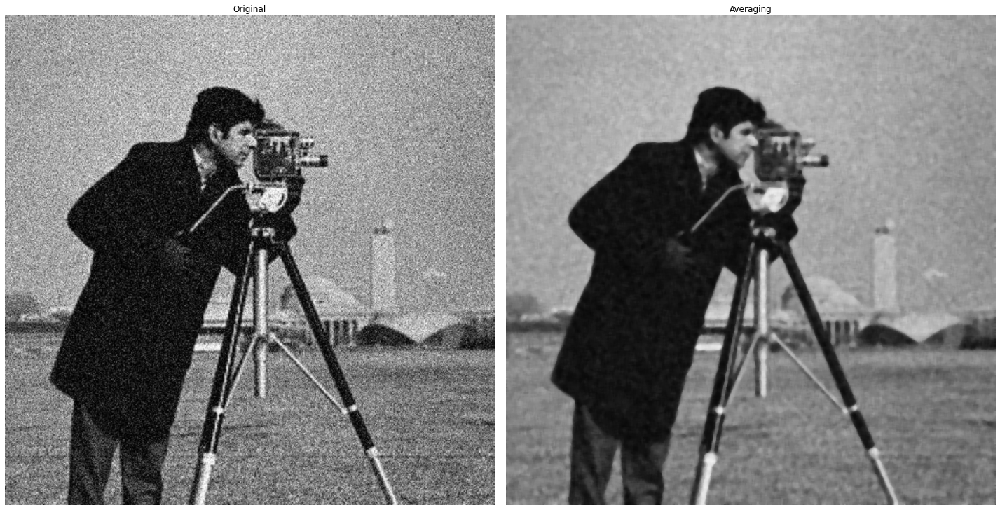

In [121]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(img)
ax[0].axis('off')
ax[0].set_title('Original')

ax[1].imshow(dst)
ax[1].axis('off')
ax[1].set_title('Averaging')

fig.tight_layout()

plt.show()

## Filtro medio 

El filtro medio es un ejemplo de un filtro lineal. Básicamente reemplaza cada píxel de la imagen de salida con el valor medio (promedio) de la vecindad. Esto tiene el efecto de suavizar la imagen (reducir la cantidad de variaciones de intensidad entre un píxel y el siguiente), eliminar el ruido de la imagen e iluminar la imagen.

Por lo tanto, en el filtrado medio, cada píxel de la imagen se reemplazará con el valor medio de sus vecinos, incluido el píxel en sí. El núcleo utilizado para el filtrado medio de 9x9.

Un punto importante a mencionar aquí es que todos los elementos del núcleo medio deben sumar 1

In [122]:
# read the image
img = cv2.imread('Images/cameramannoise.jpg')
# apply the 3x3 mean filter on the image
kernel = np.ones((9,9),np.float32)/81
dst = cv2.filter2D(img,-1,kernel)

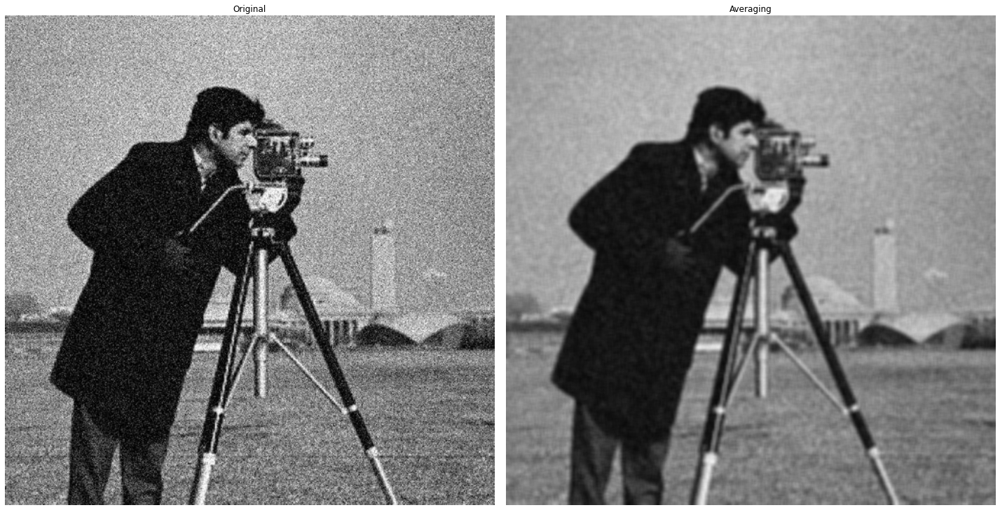

In [123]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(img)
ax[0].axis('off')
ax[0].set_title('Original')

ax[1].imshow(dst)
ax[1].axis('off')
ax[1].set_title('Averaging')

fig.tight_layout()

plt.show()

##  Filtrado gaussiano

En este enfoque, en lugar de un filtro de caja que consta de coeficientes de filtro iguales, se utiliza un kernel gaussiano. Se hace con la función, cv2. GaussianBlur(). Debemos especificar el ancho y alto del núcleo que debe ser positivo e impar. También debemos especificar la desviación estándar en las direcciones X e Y, sigmaX y sigmaY respectivamente. Si sólo se especifica sigmaX, sigmaY se toma como igual a sigmaX. Si ambos se dan como ceros, se calculan a partir del tamaño del kernel. El filtrado gaussiano es muy eficaz para eliminar el ruido gaussiano de la imagen.

Si se quiere, puede crear un kernel gaussiano con la función cv2.getGaussianKernel().

Se aplica una máscara 17x17

In [124]:
# read the image
img = cv2.imread('Images/cameramannoise.jpg') 
# apply the 3x3 mean filter on the image
dst = cv2.GaussianBlur(img,(17,17),0)

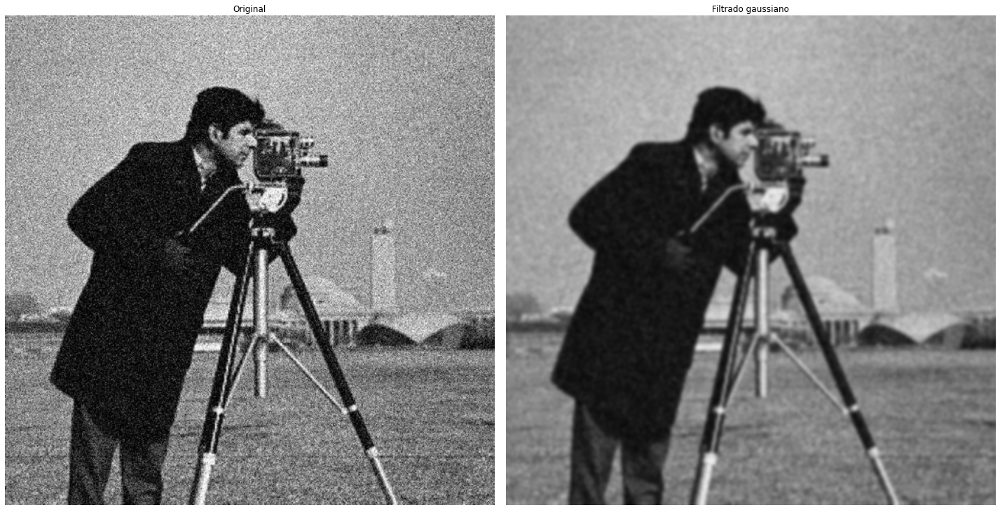

In [125]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(img)
ax[0].axis('off')
ax[0].set_title('Original')

ax[1].imshow(dst)
ax[1].axis('off')
ax[1].set_title('Filtrado gaussiano')

fig.tight_layout()

plt.show()

## Filtrado bilateral

Como hemos señalado, los filtros que presentamos anteriormente tienden a difuminar los bordes. Este no es el caso del filtro bilateral, cv2.bilateralFilter(),que se definió para, y es altamente eficaz en la eliminación de ruido conservando los bordes. Pero la operación es más lenta en comparación con otros filtros. Ya vimos que un filtro gaussiano toma el vecindario alrededor del píxel y encuentra su promedio ponderado gaussiano. Este filtro gaussiano es una solo una función de espacio , es decir, los píxeles cercanos se consideran durante el filtrado. No tiene en cuenta si los píxeles tienen casi el mismo valor de intensidad y no tiene en cuenta si el píxel se encuentra en un borde o no. El efecto resultante es que los filtros gaussianos tienden a difuminar los bordes, lo cual no es deseable.

El filtro bilateral también utiliza un filtro gaussiano en el dominio espacial, pero también utiliza un componente de filtro gaussiano más (multiplicativo) que es una función de las diferencias de intensidad de píxeles. La función gaussiana del espacio garantiza que solo los píxeles sean 'vecinos espaciales' se consideran para el filtrado, mientras que el componente gaussiano aplicado en el dominio de intensidad (una función gaussiana de las diferencias de intensidad) garantiza que solo se incluyan aquellos píxeles con intensidades similares a las del píxel central ('vecinos de intensidad') para calcular el valor de intensidad borrosa. Como resultado, este método conserva los bordes, ya que para los píxeles que se encuentran cerca de los bordes, los píxeles vecinos colocados en el otro lado del borde y, por lo tanto, la exhibición de grandes variaciones de intensidad en comparación con el píxel central, no se incluirán para el desenfoque.

Tenga en cuenta que la textura de la superficie ha desaparecido, pero los bordes aún se conservan.

In [126]:
# read the image
img = cv2.imread('Images/cameramannoise.jpg') 
# apply the 3x3 mean filter on the image
dst = cv2.bilateralFilter(img,9,75,75)

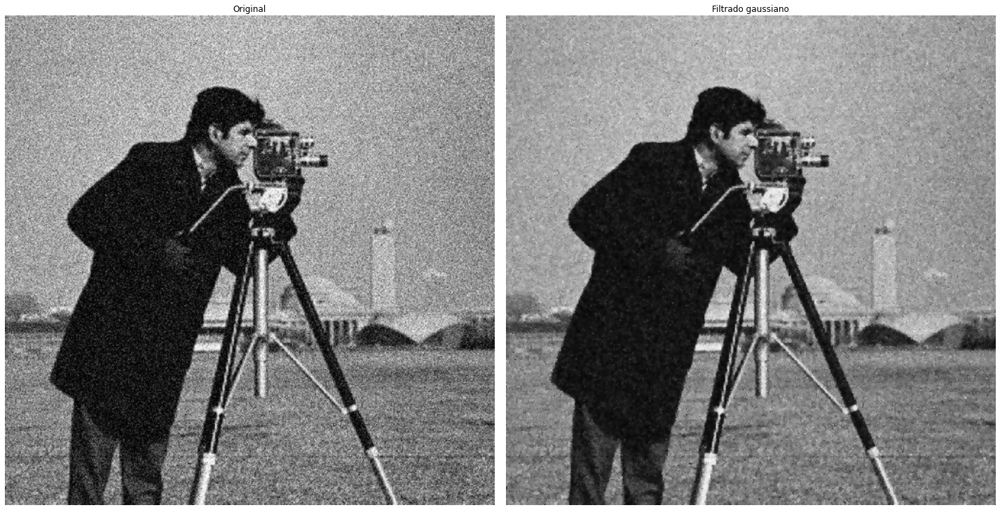

In [127]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(img)
ax[0].axis('off')
ax[0].set_title('Original')

ax[1].imshow(dst)
ax[1].axis('off')
ax[1].set_title('Filtrado gaussiano')

fig.tight_layout()

plt.show()

Información tomada de :https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_filtering/py_filtering.html

## Filtro Espacial Sharpen 

El suavizado de imagen mencionado en la sección anterior es lograr la denoción de la imagen desenfocando la imagen, pero al mismo tiempo hay un problema de que el borde de la imagen se desvanece. Por lo tanto, el filtrado de enfoque de imagen en esta sección es justo lo contrario. El suavizado de imágenes es un proceso integral. El enfoque de la imagen es la mejora de los bordes y otras mutaciones por diferenciación de imagen, lo que debilita el área donde la transformación de la escala de grises es lenta.

En la operación de enfoque de diferenciación de imagen, cualquier definición del diferencial de primer orden debe garantizar los tres puntos siguientes:

El valor diferencial en el área gris constante es cero.
El valor diferencial es distinto de cero en pasos o pendientes en escala de grises.
El valor diferencial a lo largo de la pendiente es distinto de cero.
La misma analogía garantiza los tres puntos siguientes para cualquier diferencial de segundo orden:

El valor diferencial en la región constante es cero
El valor diferencial es distinto de cero al principio del paso o rampa de escala de grises
El valor diferencial a lo largo de la pendiente es distinto de cero

1, nitidez diferencial de imagen de segundo orden - operador laplaciano
En primer lugar una función de imagen bidimensionalf(x,y) El Laplacian se define como:
![image.png](attachment:image.png)

La transformación Laplace es un operador lineal que se discretiza en la dirección x:
![image-2.png](attachment:image-2.png)

La discretización en la dirección y es:
![image-3.png](attachment:image-3.png)

De las tres ecuaciones anteriores, podemos concluir que el Laplaciano discreto es:
![image-4.png](attachment:image-4.png)

La fórmula anterior es un método de cálculo en el operador Laplacian, que es equivalente a la plantilla laplacian 1 en la figura siguiente. La plantilla laplacian natural 2 también puede escribir de forma analógica la fórmula del operador discreto:
![image-5.png](attachment:image-5.png)


Nota: Dado que laplacian es un operador diferencial, hace hincapié en la transformación de la escala de grises en la imagen, ignorando la región donde la transformación de escala de grises de la imagen es lenta. Así que lo que obtenemos a través del operador laplaciano es que la imagen es más una línea de borde, por lo quepodemos superponer la imagen original y la imagen laplacian para restaurar las características de fondo y mantener el efecto de afilado laplacian, produciendo así la siguiente fórmula:

![image-6.png](attachment:image-6.png)
Para la plantilla laplacian 1 y la plantilla laplacian 2 mostrada anteriormente, la constante c es -1 También hay otras plantillas, que no se detallan aquí.


A continuación se muestra un ejemplo de aplicación mediante la función opencv y la autoimplementación de la plantilla Laplacian anterior:

In [128]:
import cv2
import copy
import random
import imutils
import numpy as np

img = cv2.imread('Images/luna.jpg')

 #Manually implement Laplacian filtering, using the above laplacian template1
lap_img1 = copy.deepcopy(img)
for i in range(1, img.shape[0]-1):
    for j in range(1, img.shape[1]-1):
        temp = img[i+1, j] + img[i-1, j] + img[i, j+1] + img[i, j-1] -4*img[i, j]
        lap_img1[i, j] = img[i, j] - temp

 #Manually implement Laplacian filtering, using the above laplacian template2
lap_img2 = copy.deepcopy(img)
for i in range(1, img.shape[0]-1):
    for j in range(1, img.shape[1]-1):
        temp = img[i-1, j-1] + img[i-1, j] + img[i-1, j+1] + img[i, j-1] + \
                img[i, j+1] + img[i+1, j-1] + img[i+1, j] + img[i+1, j+1] - 8*img[i, j]
        lap_img2[i, j] = img[i, j] - temp

 #Use opencv comes with a function implementation, using the above laplacian template1
kernel = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])  #defined the convolution kernel, operate on each pixel
lapkernel_img = cv2.filter2D(img, -1, kernel)
lap_img3 = img - lapkernel_img


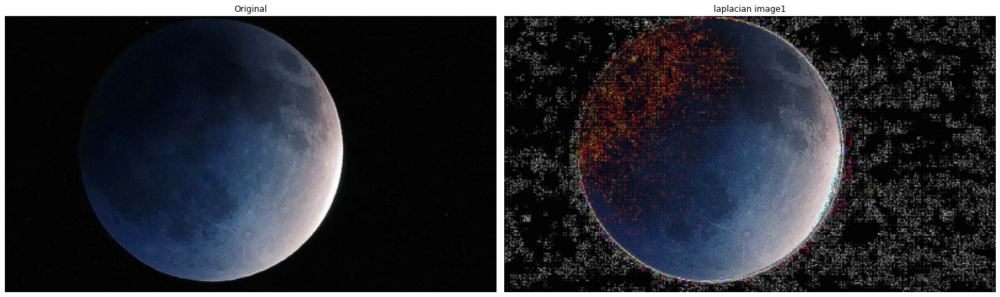

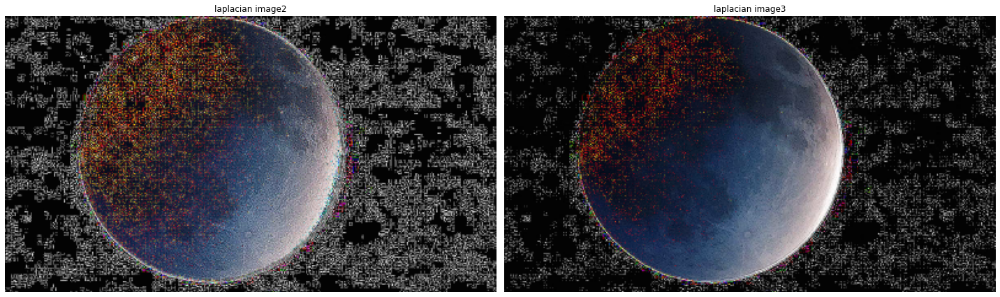

In [129]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(imutils.resize(img, 400))
ax[0].axis('off')
ax[0].set_title('Original')

ax[1].imshow(imutils.resize(lap_img1, 400))
ax[1].axis('off')
ax[1].set_title('laplacian image1')

fig.tight_layout()

plt.show()

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(imutils.resize(lap_img2, 400))
ax[0].axis('off')
ax[0].set_title('laplacian image2')

ax[1].imshow(imutils.resize(lap_img3, 400))
ax[1].axis('off')
ax[1].set_title('laplacian image3')

fig.tight_layout()

plt.show()

##  unsharp masking 

La idea del enmascarar unsharp  es restar la imagen suave de la imagen original, de modo que la imagen con el borde enfatizado se agrega, y luego se agrega a la imagen original para lograr el efecto de enfatizar el borde de la imagen. Los pasos específicos son los siguientes:

Imagen original borrosa<br/>
Restar la imagen borrosa de la imagen original (la imagen de diferencia resultante se denomina plantilla)<br/>
Agregue la plantilla a la imagen original<br/>
A continuación, convierta las ideas anteriores en fórmulas matemáticas:<br/>

![image.png](attachment:image.png)

A continuación, agregue una parte de peso de la plantilla a la imagen original:<br/>

![image-2.png](attachment:image-2.png)

El código que se proporciona a continuación lo implementa de la siguiente manera:

In [130]:
import cv2
import copy
import random
import imutils
import numpy as np

img = cv2.imread('Images/rostro.jpg')
blur_img = cv2.blur(img, (9, 9))

mask_img = img - blur_img
sharp_mask_img = img + mask_img

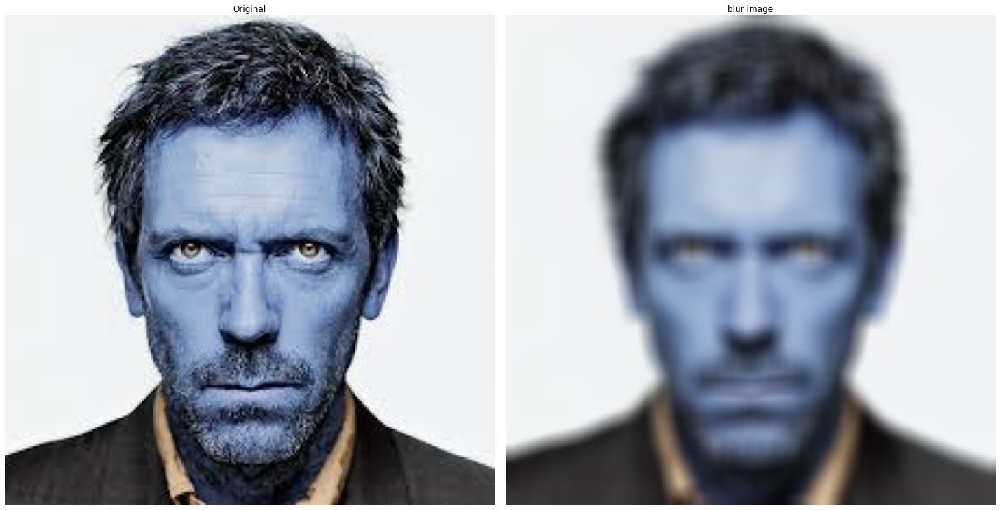

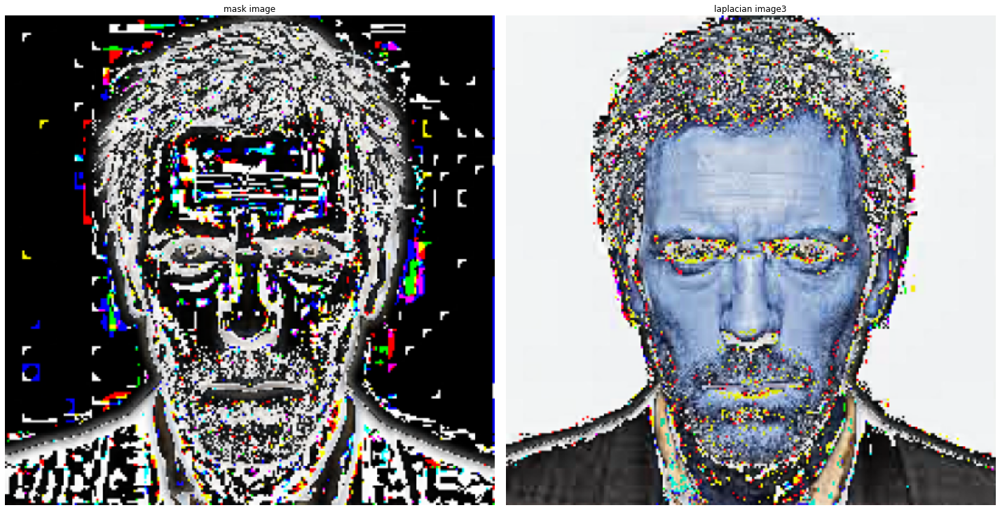

In [131]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(imutils.resize(img, 400))
ax[0].axis('off')
ax[0].set_title('Original')

ax[1].imshow(imutils.resize(blur_img, 400))
ax[1].axis('off')
ax[1].set_title('blur image')

fig.tight_layout()

plt.show()

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(imutils.resize(mask_img, 400))
ax[0].axis('off')
ax[0].set_title('mask image')

ax[1].imshow(imutils.resize(sharp_mask_img, 400))
ax[1].axis('off')
ax[1].set_title('laplacian image3')

fig.tight_layout()

plt.show()

Filtro de kernel de convolución personalizada cv2.filter2D ()

La función cv2.filter2D() en opencv-python permite operaciones personalizadas de kernel e convolución de imágenes. cv2.filter2D() se define generalmente como:

In [132]:
import cv2
import copy
import random
import imutils
import numpy as np

img = cv2.imread('Images/rostro.jpg')
kernel = np.array([
    [-1, 0, 1], 
    [-1, 5, 1], 
    [-1, 0, 1]]
)  #Kernel de convolución personalizado
new_img = cv2.filter2D(img, -1, kernel)

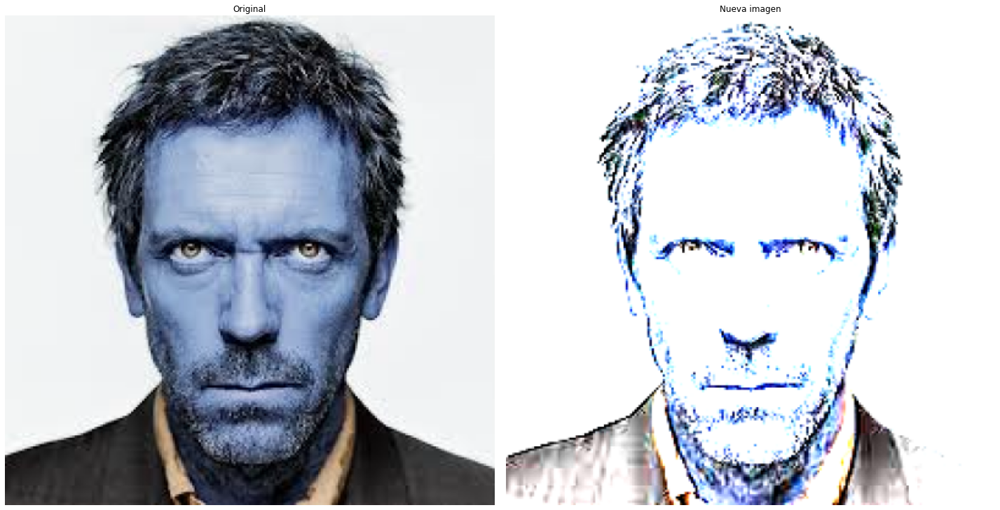

In [133]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10),
                       sharex=True, sharey=True)

plt.gray()

ax[0].imshow(imutils.resize(img, 400))
ax[0].axis('off')
ax[0].set_title('Original')

ax[1].imshow(imutils.resize(new_img, 400))
ax[1].axis('off')
ax[1].set_title('Nueva imagen')

fig.tight_layout()

plt.show()

## Detección de bordes 

La detección de bordes es una de las operaciones fundamentales cuando realizamos el procesamiento de imágenes. Nos ayuda a reducir la cantidad de datos (píxeles) para procesar y mantiene el aspecto estructural de la imagen. Vamos a examinar dos esquemas de detección de bordes comúnmente utilizados - el detector de borde basado en gradiente (Sobel - derivados de primer orden) y el detector de bordes basado en Laplacian (2o orden derivado, por lo que es extremadamente sensible al ruido). Ambos trabajan con convoluciones y logran el mismo objetivo final: Detección de bordes.

<h4>Detección de bordes de Sobel</h4>
El detector de bordes Sobel es un método basado en gradiente basado en los derivados de la primera orden. Calcula los primeros derivados de la imagen por separado para los ejes X e Y.<br/>

El operador utiliza dos kernels 3X3 que están convolucionados con la imagen original para calcular las aproximaciones de los derivados - uno para los cambios horizontales, y uno para vertical. La siguiente imagen muestra Sobel Kernels en x-dir e y-dir:<br/>

![image.png](attachment:image.png)

<h4>Detección de bordes laplacian</h4>
A diferencia del detector de bordes Sobel, el detector de bordes Laplacian utiliza solo un núcleo. Calcula derivados de segunda orden en una sola pasada.<br/>

Un kernel utilizado en esta detección laplacian tiene este aspecto:<br/>
![image-2.png](attachment:image-2.png)

Si queremos considerar las diagonales, podemos utilizar el núcleo de abajo:
![image-3.png](attachment:image-3.png)

cv2.Laplacian(src, ddepth, other_options...)

donde ddepth es la profundidad deseada de la imagen de destino.



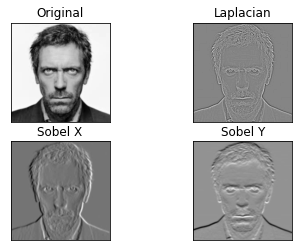

In [134]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# loading image
#img0 = cv2.imread('SanFrancisco.jpg',)
img0 = cv2.imread('Images/rostro.jpg',)

# converting to gray scale
gray = cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY)

# remove noise
img = cv2.GaussianBlur(gray,(3,3),0)

# convolute with proper kernels
laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)  # x
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)  # y

plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])

plt.show()

## Filtros Morfologicos

El procesamiento de imágenes morfológicas es una colección de operaciones no lineales relacionadas con la forma o morfología de las características de una imagen, como límites, esqueletos, etc. En cualquier técnica dada, probamos una imagen con una pequeña forma o plantilla llamada elemento estructurante. , que define la región de interés o vecindad alrededor de un píxel.

In [135]:
##Importar Librerias
import cv2 as cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from skimage.morphology import erosion, dilation, opening, closing, white_tophat
from skimage.morphology import black_tophat, skeletonize, convex_hull_image
from skimage.morphology import disk ,rectangle
from skimage.data import data_dir
from skimage.util import img_as_ubyte
from skimage import io
from skimage import color
# se usa un kernel en forma de rectangulo
selem = rectangle(8,8)
#kernel usado para Open cv
kernel = np.array([[1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1]])

#### Actividad
En este caso se usaran filtros morfologicos con una imagen bidimencional, la cual es una radiografia que incluye la rama pulmonar como punto a desarrollar se identificaran las operaciones que contribuyan a una tranformacion de la imagen que ayude a entender mejor la rama pulmonar o sus ramificaciones ampliando su detalle.  usando las librerias **Open-CV y Scikit-image** los filtros a usar seran :

1.   Erosion
2.   Dilation
3.   Opening
4.   Closing
5.   White Tophat
6.   Black Tophat




In [136]:
##Crear utilidades
def plot_comparison(original, filtered,filteredOpen, filter_name):

    fig, (ax1, ax2,ax3) = plt.subplots(ncols=3, figsize=(16, 8), sharex=True,
                                   sharey=True)
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title('Original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(filter_name + "Skimage")
    ax2.axis('off')
    ax3.imshow(filteredOpen, cmap=plt.cm.gray)
    ax3.set_title(filter_name + "Open CV")
    ax3.axis('off')

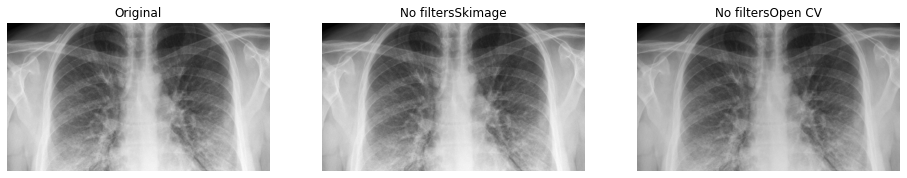

In [137]:
###Obtener Y cargar Imagen
#skimage
skl_chest_image =  img_as_ubyte(io.imread(os.path.join('Images/chestRadio.jpg'),as_gray=True))
#OpenCv
openCv_chest_image = cv2.imread('Images/chestRadio.jpg', cv2.COLOR_BGR2GRAY)
#Mostrar Imagenes cargadas
plot_comparison(skl_chest_image, skl_chest_image,openCv_chest_image, "No filters")


### Erosion

La erosión (generalmente representada por ⊖) es una de las dos operaciones fundamentales (la otra es la dilatación) en el procesamiento de imágenes morfológicas en la que se basan todas las demás operaciones morfológicas. Originalmente se definió para imágenes binarias, luego se extendió a imágenes en escala de grises y, posteriormente, a celosías completas. La operación de erosión suele utilizar un elemento estructurador para sondear y reducir las formas contenidas en la imagen de entrada.

https://en.wikipedia.org/wiki/Erosion_(morphology)



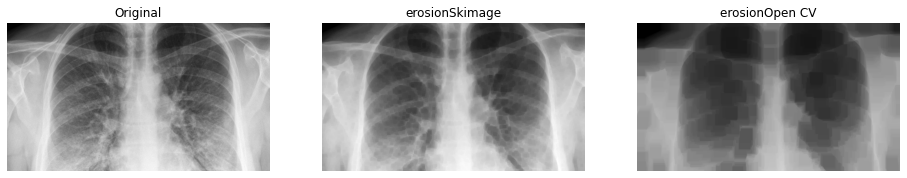

In [138]:
#Aplicar filtro con skimage
eroded_skl = erosion(skl_chest_image, selem)
#Aplicar filtro con OpenCv
eroded_ocv = cv2.erode(openCv_chest_image,kernel,iterations = 10)

plot_comparison(skl_chest_image, eroded_skl,eroded_ocv, 'erosion')


En este caso se logra apreciar que se perdieron los detalles de las ramas pulmonares que eran de color blanco perdiendo visibilidad, para el caso practico de resaltar estas partes esta operacion es poco practica sin un filtrado previo.

### Dilation
La dilatación morfológica establece un píxel en (i, j) al máximo sobre todos los píxeles en la vecindad centrada en (i, j). La dilatación agranda las regiones brillantes y encoge las regiones oscuras.

https://scikit-image.org/docs/dev/auto_examples/applications/plot_morphology.html#sphx-glr-auto-examples-applications-plot-morphology-py



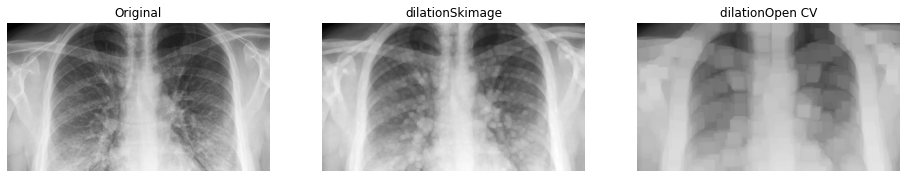

In [139]:
#Aplicar filtro con skimage
dilation_skl = dilation(skl_chest_image, selem)
#Aplicar filtro con OpenCv
dilation_ocv = cv2.dilate(openCv_chest_image,kernel,iterations = 10)

plot_comparison(skl_chest_image, dilation_skl,dilation_ocv, 'dilation')

Para este caso se logra ver el agtrandamiento de una forma agresiva de las finas ramas pulmonares lo que hace dificil ver las ramificaciones. se logra ver una implementacion mas agresiva usando Opencv con un kernel mayor

### Opening
La apertura morfológica en una imagen se define como una erosión seguida de una dilatación. La apertura puede eliminar pequeños puntos brillantes (es decir, "sal") y conectar pequeñas grietas oscuras.

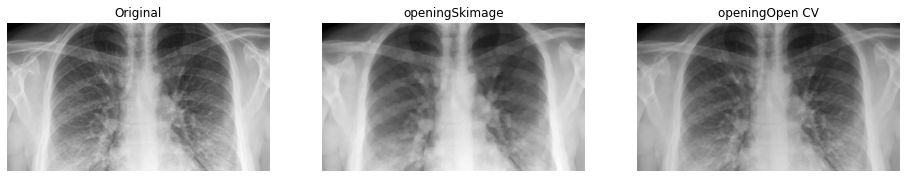

In [140]:
#Aplicar filtro con skimage
open_skl = opening(skl_chest_image, selem)
#Aplicar filtro con OpenCv
open_ocv = cv2.morphologyEx(openCv_chest_image, cv.MORPH_OPEN, kernel)

plot_comparison(skl_chest_image, open_skl,open_ocv, 'opening')

en este caso se logra identificar  que las zonas blancas son mas resaltadas , sin embargo se aprecia la perdida de algunos detalles de las ramificaciones, se identifica que open cv tiene los mejores resultados aplicados a la imagen

###Closing
El cierre morfológico de una imagen se define como una dilatación seguida de una erosión. El cierre puede eliminar pequeñas manchas oscuras (es decir, "pimienta") y conectar pequeñas grietas brillantes.

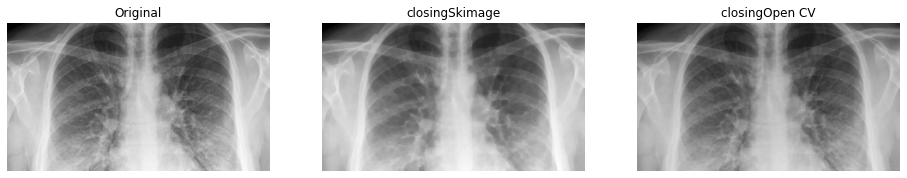

In [141]:
#Aplicar filtro con skimage
close_skl = closing(skl_chest_image, selem)
#Aplicar filtro con OpenCv
close_ocv = cv2.morphologyEx(openCv_chest_image, cv.MORPH_CLOSE, kernel)

plot_comparison(skl_chest_image, close_skl,close_ocv, 'closing')

En este caso

## White Tophat
El White Tophat de una imagen se define como la imagen menos su apertura morfológica. Esta operación devuelve los puntos brillantes de la imagen que son más pequeños que el elemento estructurante.


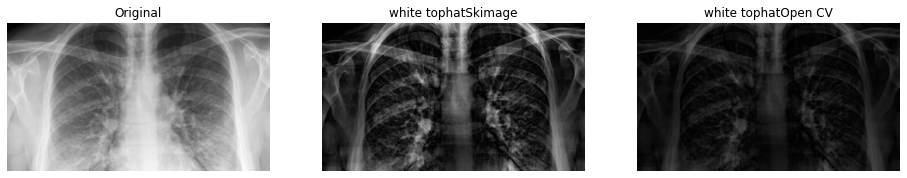

In [142]:
kernelA = np.ones((90,90),np.uint8)
selemA = rectangle(90,90)
#Aplicar filtro con skimage
wt_skl =   white_tophat(skl_chest_image, selemA)
#Aplicar filtro con OpenCv
wt_ocv = cv2.morphologyEx(openCv_chest_image, cv.MORPH_TOPHAT,kernelA)

plot_comparison(skl_chest_image, wt_skl,wt_ocv, 'white tophat')

modificando el kernel de la implementacion en los dos casos se logra ver un mayor detalle en las imagenes perdiendo la luminosidad y dejando ver mas detalles en los huesos y ramificaciones.

### Black tophat

El black_tophat de una imagen se define como su cierre morfológico menos la imagen original. Esta operación devuelve los puntos oscuros de la imagen que son más pequeños que el elemento estructurante.

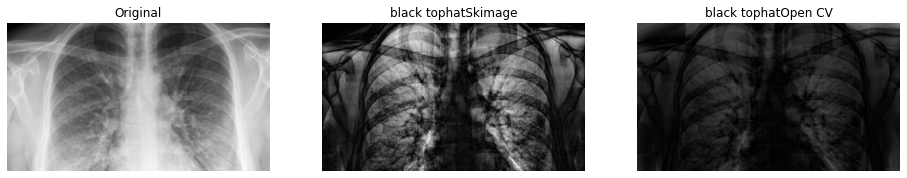

In [143]:
kernelA = np.ones((90,90),np.uint8)
selemA = rectangle(90,90)
#Aplicar filtro con skimage
bt_skl = black_tophat(skl_chest_image, selemA)
#Aplicar filtro con OpenCv
bt_ocv = cv2.morphologyEx(openCv_chest_image, cv.MORPH_BLACKHAT,kernelA)

plot_comparison(skl_chest_image, bt_skl,bt_ocv, 'black tophat')

Tomado de :https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Gradient_Sobel_Laplacian_Derivatives_Edge_Detection.php